Import and Install the required Libraries and Packages

In [129]:
pip install chart-studio

In [130]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt # visualizing data
import seaborn as sns 
from collections import Counter
%matplotlib inline
from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go
import plotly.figure_factory as ff
import os
import chart_studio.plotly as py
import plotly.graph_objs as go
import seaborn as sns
import networkx as nx
from itertools import combinations
import plotly.express as px

In [131]:
pd.set_option("display.max_rows", None)

In [132]:
import plotly.graph_objects as go

def plot_distribution(pd_series):
    labels = pd_series.value_counts().index.tolist()
    counts = pd_series.value_counts().values.tolist()
    
    pie_plot = go.Pie(labels=labels, values=counts, hole=.3)
    fig = go.Figure(data=[pie_plot])
    fig.update_layout(title_text='Distribution for %s' % pd_series.name)
    
    fig.show()

Read the Dataset

In [133]:
dataco_df = pd.read_csv("/content/DataCoSupplyChainDataset.csv",encoding='latin-1')

Initial data frame check and preparation

In [134]:
dataco_df.head(20)

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,...,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Image,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode
0,DEBIT,3,4,91.250000,314.640015,Advance shipping,0,73,Sporting Goods,Caguas,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,2/3/2018 22:56,Standard Class
1,TRANSFER,5,4,-249.089996,311.359985,Late delivery,1,73,Sporting Goods,Caguas,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/18/2018 12:27,Standard Class
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,73,Sporting Goods,San Jose,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/17/2018 12:06,Standard Class
3,DEBIT,3,4,22.860001,304.809998,Advance shipping,0,73,Sporting Goods,Los Angeles,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/16/2018 11:45,Standard Class
4,PAYMENT,2,4,134.210007,298.250000,Advance shipping,0,73,Sporting Goods,Caguas,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/15/2018 11:24,Standard Class
5,TRANSFER,6,4,18.580000,294.980011,Shipping canceled,0,73,Sporting Goods,Tonawanda,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/19/2018 11:03,Standard Class
6,DEBIT,2,1,95.180000,288.420013,Late delivery,1,73,Sporting Goods,Caguas,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/15/2018 10:42,First Class
7,TRANSFER,2,1,68.430000,285.140015,Late delivery,1,73,Sporting Goods,Miami,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/15/2018 10:21,First Class
8,CASH,3,2,133.720001,278.589996,Late delivery,1,73,Sporting Goods,Caguas,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/16/2018 10:00,Second Class
9,CASH,2,1,132.149994,275.309998,Late delivery,1,73,Sporting Goods,San Ramon,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/15/2018 9:39,First Class


In [135]:
dataco_df.tail(20)

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,...,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Image,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode
180499,DEBIT,4,2,-258.779999,387.980011,Late delivery,1,45,Fishing,Caguas,...,NaN,1004,45,NaN,http://images.acmesports.sports/Field+%26+Stre...,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/20/2016 17:41,Second Class
180500,DEBIT,3,4,138.229996,383.980011,Advance shipping,0,45,Fishing,Saint Paul,...,NaN,1004,45,NaN,http://images.acmesports.sports/Field+%26+Stre...,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/19/2016 15:35,Standard Class
180501,PAYMENT,2,4,42.939999,379.980011,Advance shipping,0,45,Fishing,Vista,...,NaN,1004,45,NaN,http://images.acmesports.sports/Field+%26+Stre...,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/18/2016 15:14,Standard Class
180502,PAYMENT,2,4,23.809999,377.980011,Advance shipping,0,45,Fishing,Vista,...,NaN,1004,45,NaN,http://images.acmesports.sports/Field+%26+Stre...,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/18/2016 15:14,Standard Class
180503,PAYMENT,2,4,125.730003,371.980011,Advance shipping,0,45,Fishing,Vista,...,NaN,1004,45,NaN,http://images.acmesports.sports/Field+%26+Stre...,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/18/2016 15:14,Standard Class
180504,CASH,3,4,32.029999,363.980011,Advance shipping,0,45,Fishing,Caguas,...,NaN,1004,45,NaN,http://images.acmesports.sports/Field+%26+Stre...,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/19/2016 13:49,Standard Class
180505,DEBIT,2,4,112.669998,359.980011,Advance shipping,0,45,Fishing,Highland,...,NaN,1004,45,NaN,http://images.acmesports.sports/Field+%26+Stre...,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/18/2016 13:28,Standard Class
180506,PAYMENT,2,1,-65.470001,351.980011,Late delivery,1,45,Fishing,San Antonio,...,NaN,1004,45,NaN,http://images.acmesports.sports/Field+%26+Stre...,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/18/2016 11:01,First Class
180507,PAYMENT,5,2,50.110001,347.980011,Late delivery,1,45,Fishing,Philadelphia,...,NaN,1004,45,NaN,http://images.acmesports.sports/Field+%26+Stre...,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/21/2016 9:16,Second Class
180508,DEBIT,4,2,85.000000,339.980011,Late delivery,1,45,Fishing,Waipahu,...,NaN,1004,45,NaN,http://images.acmesports.sports/Field+%26+Stre...,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/20/2016 7:10,Second Class


In [136]:
dataco_df.shape

(180519, 53)

In [137]:
dataco_df.dtypes

Type                              object
Days for shipping (real)           int64
Days for shipment (scheduled)      int64
Benefit per order                float64
Sales per customer               float64
Delivery Status                   object
Late_delivery_risk                 int64
Category Id                        int64
Category Name                     object
Customer City                     object
Customer Country                  object
Customer Email                    object
Customer Fname                    object
Customer Id                        int64
Customer Lname                    object
Customer Password                 object
Customer Segment                  object
Customer State                    object
Customer Street                   object
Customer Zipcode                 float64
Department Id                      int64
Department Name                   object
Latitude                         float64
Longitude                        float64
Market          

In [138]:
dataco_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180519 entries, 0 to 180518
Data columns (total 53 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   Type                           180519 non-null  object 
 1   Days for shipping (real)       180519 non-null  int64  
 2   Days for shipment (scheduled)  180519 non-null  int64  
 3   Benefit per order              180519 non-null  float64
 4   Sales per customer             180519 non-null  float64
 5   Delivery Status                180519 non-null  object 
 6   Late_delivery_risk             180519 non-null  int64  
 7   Category Id                    180519 non-null  int64  
 8   Category Name                  180519 non-null  object 
 9   Customer City                  180519 non-null  object 
 10  Customer Country               180519 non-null  object 
 11  Customer Email                 180519 non-null  object 
 12  Customer Fname                

In [139]:
dataco_df.describe()

,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Late_delivery_risk,Category Id,Customer Id,Customer Zipcode,Department Id,Latitude,...,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Price,Product Status
count,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180516.000000,180519.000000,180519.000000,...,180519.000000,180519.000000,180519.000000,180519.000000,24840.000000,180519.000000,180519.000000,0.0,180519.000000,180519.0
mean,3.497654,2.931847,21.974989,183.107609,0.548291,31.851451,6691.379495,35921.126914,5.443460,29.719955,...,2.127638,203.772096,183.107609,21.974989,55426.132327,692.509764,31.851451,NaN,141.232550,0.0
std,1.623722,1.374449,104.433526,120.043670,0.497664,15.640064,4162.918106,37542.461122,1.629246,9.813646,...,1.453451,132.273077,120.043670,104.433526,31919.279101,336.446807,15.640064,NaN,139.732492,0.0
min,0.000000,0.000000,-4274.979980,7.490000,0.000000,2.000000,1.000000,603.000000,2.000000,-33.937553,...,1.000000,9.990000,7.490000,-4274.979980,1040.000000,19.000000,2.000000,NaN,9.990000,0.0
25%,2.000000,2.000000,7.000000,104.379997,0.000000,18.000000,3258.500000,725.000000,4.000000,18.265432,...,1.000000,119.980003,104.379997,7.000000,23464.000000,403.000000,18.000000,NaN,50.000000,0.0
50%,3.000000,4.000000,31.520000,163.990005,1.000000,29.000000,6457.000000,19380.000000,5.000000,33.144863,...,1.000000,199.919998,163.990005,31.520000,59405.000000,627.000000,29.000000,NaN,59.990002,0.0
75%,5.000000,4.000000,64.800003,247.399994,1.000000,45.000000,9779.000000,78207.000000,7.000000,39.279617,...,3.000000,299.950012,247.399994,64.800003,90008.000000,1004.000000,45.000000,NaN,199.990005,0.0
max,6.000000,4.000000,911.799988,1939.989990,1.000000,76.000000,20757.000000,99205.000000,12.000000,48.781933,...,5.000000,1999.989990,1939.989990,911.799988,99301.000000,1363.000000,76.000000,NaN,1999.989990,0.0


In [140]:
dataco_df.columns

Index(['Type', 'Days for shipping (real)', 'Days for shipment (scheduled)',
       'Benefit per order', 'Sales per customer', 'Delivery Status',
       'Late_delivery_risk', 'Category Id', 'Category Name', 'Customer City',
       'Customer Country', 'Customer Email', 'Customer Fname', 'Customer Id',
       'Customer Lname', 'Customer Password', 'Customer Segment',
       'Customer State', 'Customer Street', 'Customer Zipcode',
       'Department Id', 'Department Name', 'Latitude', 'Longitude', 'Market',
       'Order City', 'Order Country', 'Order Customer Id',
       'order date (DateOrders)', 'Order Id', 'Order Item Cardprod Id',
       'Order Item Discount', 'Order Item Discount Rate', 'Order Item Id',
       'Order Item Product Price', 'Order Item Profit Ratio',
       'Order Item Quantity', 'Sales', 'Order Item Total',
       'Order Profit Per Order', 'Order Region', 'Order State', 'Order Status',
       'Order Zipcode', 'Product Card Id', 'Product Category Id',
       'Product De

In [141]:
dataco_df.isnull().sum()

Type                                  0
Days for shipping (real)              0
Days for shipment (scheduled)         0
Benefit per order                     0
Sales per customer                    0
Delivery Status                       0
Late_delivery_risk                    0
Category Id                           0
Category Name                         0
Customer City                         0
Customer Country                      0
Customer Email                        0
Customer Fname                        0
Customer Id                           0
Customer Lname                        8
Customer Password                     0
Customer Segment                      0
Customer State                        0
Customer Street                       0
Customer Zipcode                      3
Department Id                         0
Department Name                       0
Latitude                              0
Longitude                             0
Market                                0


Excluding Columns with null values, personal and redundant information

In [142]:
dataco_df.drop([
    'Customer Email', 
    'Customer Password',
    'Product Image',
    'Order Zipcode',
    'Product Description'
], axis = True, inplace = True)

Replacing spaces between column labels

In [143]:
dataco_df.columns = dataco_df.columns.str.replace(' ', '_')

# Statistical Analysis of Numerical Categorical features

In [146]:
cat_name = dataco_df.Category_Name.value_counts()
cat_name

Cleats                  24551
Men's Footwear          22246
Women's Apparel         21035
Indoor/Outdoor Games    19298
Fishing                 17325
Water Sports            15540
Camping & Hiking        13729
Cardio Equipment        12487
Shop By Sport           10984
Electronics              3156
Accessories              1780
Golf Balls               1475
Girls' Apparel           1201
Golf Gloves              1070
Trade-In                  974
Video Games               838
Children's Clothing       652
Women's Clothing          650
Baseball & Softball       632
Hockey                    614
Cameras                   592
Toys                      529
Golf Shoes                524
Pet Supplies              492
Garden                    484
Crafts                    484
DVDs                      483
Computers                 442
Golf Apparel              441
Hunting & Shooting        440
Music                     434
Consumer Electronics      431
Boxing & MMA              423
Books     

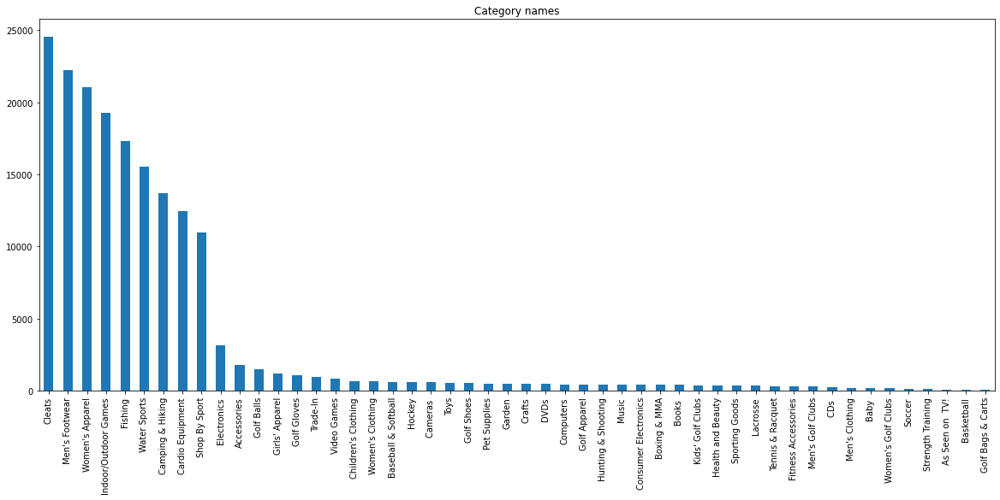

In [149]:
cat_name.plot.bar(figsize=(20,8), title="Category names")

In [145]:
dataco_df.columns

Index(['Type', 'Days_for_shipping_(real)', 'Days_for_shipment_(scheduled)',
       'Benefit_per_order', 'Sales_per_customer', 'Delivery_Status',
       'Late_delivery_risk', 'Category_Id', 'Category_Name', 'Customer_City',
       'Customer_Country', 'Customer_Fname', 'Customer_Id', 'Customer_Lname',
       'Customer_Segment', 'Customer_State', 'Customer_Street',
       'Customer_Zipcode', 'Department_Id', 'Department_Name', 'Latitude',
       'Longitude', 'Market', 'Order_City', 'Order_Country',
       'Order_Customer_Id', 'order_date_(DateOrders)', 'Order_Id',
       'Order_Item_Cardprod_Id', 'Order_Item_Discount',
       'Order_Item_Discount_Rate', 'Order_Item_Id', 'Order_Item_Product_Price',
       'Order_Item_Profit_Ratio', 'Order_Item_Quantity', 'Sales',
       'Order_Item_Total', 'Order_Profit_Per_Order', 'Order_Region',
       'Order_State', 'Order_Status', 'Product_Card_Id', 'Product_Category_Id',
       'Product_Name', 'Product_Price', 'Product_Status',
       'shipping_date_(

In [18]:
dataco_df.Type.unique()

array(['DEBIT', 'TRANSFER', 'CASH', 'PAYMENT'], dtype=object)

In [19]:
dataco_df.Type.value_counts()

DEBIT       69295
TRANSFER    49883
PAYMENT     41725
CASH        19616
Name: Type, dtype: int64

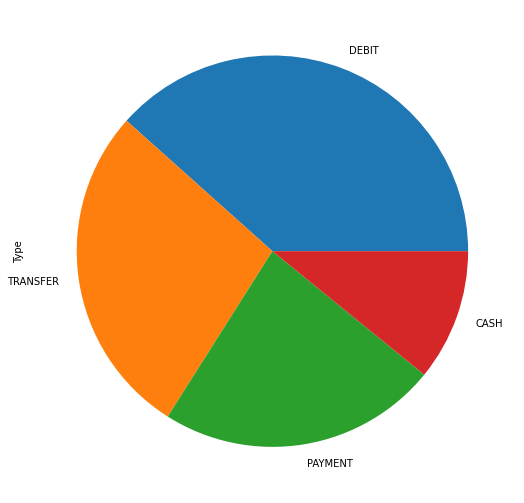

In [20]:
dataco_df.Type.value_counts().plot(kind='pie', figsize=(9,9))

In [21]:
dataco_df.Category_Name.unique()

array(['Sporting Goods', 'Cleats', 'Shop By Sport', "Women's Apparel",
       'Electronics', 'Boxing & MMA', 'Cardio Equipment', 'Trade-In',
       "Kids' Golf Clubs", 'Hunting & Shooting', 'Baseball & Softball',
       "Men's Footwear", 'Camping & Hiking', 'Consumer Electronics',
       'Cameras ', 'Computers', 'Basketball', 'Soccer', "Girls' Apparel",
       'Accessories', "Women's Clothing", 'Crafts', "Men's Clothing",
       'Tennis & Racquet', 'Fitness Accessories', 'As Seen on  TV!',
       'Golf Balls', 'Strength Training', "Children's Clothing",
       'Lacrosse', 'Baby ', 'Fishing', 'Books ', 'DVDs', 'CDs ', 'Garden',
       'Hockey', 'Pet Supplies', 'Health and Beauty', 'Music',
       'Video Games', 'Golf Gloves', 'Golf Bags & Carts', 'Golf Shoes',
       'Golf Apparel', "Women's Golf Clubs", "Men's Golf Clubs", 'Toys',
       'Water Sports', 'Indoor/Outdoor Games'], dtype=object)

In [22]:
dataco_df.Category_Name.value_counts()

Cleats                  24551
Men's Footwear          22246
Women's Apparel         21035
Indoor/Outdoor Games    19298
Fishing                 17325
Water Sports            15540
Camping & Hiking        13729
Cardio Equipment        12487
Shop By Sport           10984
Electronics              3156
Accessories              1780
Golf Balls               1475
Girls' Apparel           1201
Golf Gloves              1070
Trade-In                  974
Video Games               838
Children's Clothing       652
Women's Clothing          650
Baseball & Softball       632
Hockey                    614
Cameras                   592
Toys                      529
Golf Shoes                524
Pet Supplies              492
Garden                    484
Crafts                    484
DVDs                      483
Computers                 442
Golf Apparel              441
Hunting & Shooting        440
Music                     434
Consumer Electronics      431
Boxing & MMA              423
Books     

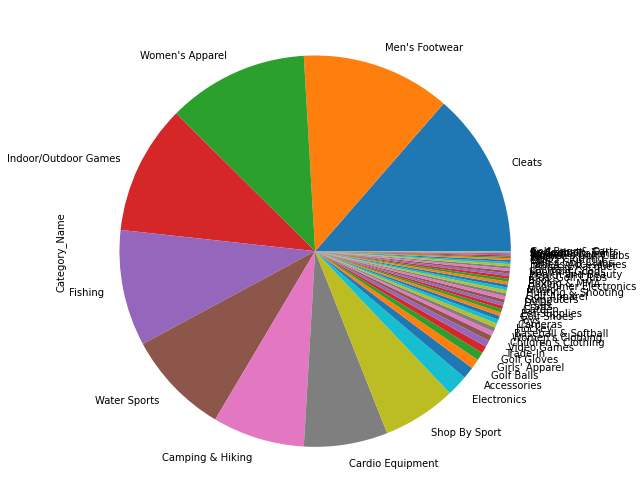

In [23]:
dataco_df.Category_Name.value_counts().plot(kind='pie', figsize=(9,9))

In [24]:
dataco_df.Delivery_Status.unique()

array(['Advance shipping', 'Late delivery', 'Shipping on time',
       'Shipping canceled'], dtype=object)

In [25]:
dataco_df.Delivery_Status.value_counts()

Late delivery        98977
Advance shipping     41592
Shipping on time     32196
Shipping canceled     7754
Name: Delivery_Status, dtype: int64

In [26]:
plot_distribution(dataco_df['Delivery_Status'])

In [27]:
dataco_df.Customer_City.unique()

array(['Caguas', 'San Jose', 'Los Angeles', 'Tonawanda', 'Miami',
       'San Ramon', 'Freeport', 'Salinas', 'Peabody', 'Canovanas',
       'Paramount', 'Mount Prospect', 'Long Beach', 'Rancho Cordova',
       'Billings', 'Wilkes Barre', 'Roseville', 'Bellflower', 'Wheaton',
       'Detroit', 'Dallas', 'Carlisle', 'Newark', 'Panorama City',
       'Atlanta', 'Fremont', 'Rochester', 'Bayamon', 'Guayama',
       'Juana Diaz', 'Fort Washington', 'Bakersfield', 'Corona',
       'Cincinnati', 'Germantown', 'Carrollton', 'Houston', 'Ewa Beach',
       'Lakewood', 'Rome', 'Vista', 'Fort Worth', 'Fond Du Lac',
       'Philadelphia', 'Ontario', 'Oviedo', 'Buffalo', 'Honolulu',
       'Oceanside', 'North Tonawanda', 'Clovis', 'Jamaica',
       'Granite City', 'Medford', 'Pomona', 'Tempe', 'Santa Ana', 'York',
       'Aurora', 'Simi Valley', 'Silver Spring', 'Saint Paul',
       'San Antonio', 'Bronx', 'Greenville', 'Morristown', 'San Diego',
       'Oxnard', 'Albuquerque', 'Amarillo', 'Lutz', 'B

In [28]:
dataco_df.Customer_City.value_counts()

Caguas                  66770
Chicago                  3885
Los Angeles              3417
Brooklyn                 3412
New York                 1816
Philadelphia             1577
Bronx                    1500
San Diego                1437
Miami                    1314
Houston                  1297
Las Vegas                1164
Dallas                   1029
Aurora                   1015
Detroit                   958
Phoenix                   945
San Jose                  943
Cleveland                 784
Lancaster                 762
San Antonio               730
Memphis                   707
Virginia Beach            691
El Paso                   649
Fort Lauderdale           646
Columbus                  642
Washington                627
Honolulu                  609
Tucson                    582
Bakersfield               581
Baltimore                 565
Albuquerque               552
Long Beach                546
Newark                    544
Saint Paul                541
Pompano Be

In [29]:
dataco_df.Customer_Country.unique()

array(['Puerto Rico', 'EE. UU.'], dtype=object)

In [30]:
plot_distribution(dataco_df['Customer_Country'])

In [31]:
dataco_df.Customer_Country.value_counts()

EE. UU.        111146
Puerto Rico     69373
Name: Customer_Country, dtype: int64

In [32]:
dataco_df.Customer_Segment.unique()

array(['Consumer', 'Home Office', 'Corporate'], dtype=object)

In [33]:
dataco_df.Customer_Segment.value_counts()

Consumer       93504
Corporate      54789
Home Office    32226
Name: Customer_Segment, dtype: int64

In [34]:
plot_distribution(dataco_df['Customer_Segment'])

In [35]:
dataco_df.Customer_State.unique()

array(['PR', 'CA', 'NY', 'FL', 'MA', 'IL', 'MT', 'PA', 'MI', 'TX', 'DE',
       'GA', 'MD', 'OH', 'HI', 'NJ', 'WI', 'AZ', 'CO', 'MN', 'NC', 'NM',
       'OR', 'SC', 'VA', 'UT', 'WA', 'KY', 'WV', 'RI', 'CT', 'LA', 'TN',
       'DC', 'ND', 'MO', 'IN', 'ID', 'NV', 'KS', 'AR', 'OK', 'AL', 'IA',
       '95758', '91732'], dtype=object)

In [36]:
dataco_df.Customer_State.value_counts()

PR       69373
CA       29223
NY       11327
TX        9103
IL        7631
FL        5456
OH        4095
PA        3824
MI        3804
NJ        3191
AZ        3026
GA        2503
MD        2415
NC        1992
CO        1914
VA        1849
OR        1668
MA        1607
TN        1582
NV        1440
MO        1354
HI        1248
CT        1094
UT         968
NM         949
LA         948
WA         920
WI         850
MN         672
SC         665
IN         581
DC         579
KY         487
KS         458
DE         269
RI         243
WV         241
OK         232
ND         215
ID         167
AR         164
MT          87
IA          67
AL          35
95758        2
91732        1
Name: Customer_State, dtype: int64

In [37]:
dataco_df.Department_Name.unique()

array(['Fitness', 'Apparel', 'Golf', 'Footwear', 'Outdoors', 'Fan Shop',
       'Technology', 'Book Shop', 'Discs Shop', 'Pet Shop',
       'Health and Beauty '], dtype=object)

In [38]:
dataco_df.Department_Name.value_counts()

Fan Shop              66861
Apparel               48998
Golf                  33220
Footwear              14525
Outdoors               9686
Fitness                2479
Discs Shop             2026
Technology             1465
Pet Shop                492
Book Shop               405
Health and Beauty       362
Name: Department_Name, dtype: int64

In [39]:
plot_distribution(dataco_df['Department_Name'])

In [40]:
dataco_df.Market.unique()

array(['Pacific Asia', 'USCA', 'Africa', 'Europe', 'LATAM'], dtype=object)

In [41]:
dataco_df.Market.value_counts()

LATAM           51594
Europe          50252
Pacific Asia    41260
USCA            25799
Africa          11614
Name: Market, dtype: int64

In [42]:
plot_distribution(dataco_df['Market'])

In [43]:
dataco_df.Order_Country.unique()

array(['Indonesia', 'India', 'Australia', 'China', 'Japón',
       'Corea del Sur', 'Singapur', 'Turquía', 'Mongolia',
       'Estados Unidos', 'Nigeria', 'República Democrática del Congo',
       'Senegal', 'Marruecos', 'Alemania', 'Francia', 'Países Bajos',
       'Reino Unido', 'Guatemala', 'El Salvador', 'Panamá',
       'República Dominicana', 'Venezuela', 'Colombia', 'Honduras',
       'Brasil', 'México', 'Uruguay', 'Argentina', 'Cuba', 'Perú',
       'Nicaragua', 'Ecuador', 'Angola', 'Sudán', 'Somalia',
       'Costa de Marfil', 'Egipto', 'Italia', 'España', 'Suecia',
       'Austria', 'Canada', 'Madagascar', 'Argelia', 'Liberia', 'Zambia',
       'Níger', 'SudAfrica', 'Mozambique', 'Tanzania', 'Ruanda', 'Israel',
       'Nueva Zelanda', 'Bangladés', 'Tailandia', 'Irak', 'Arabia Saudí',
       'Filipinas', 'Kazajistán', 'Irán', 'Myanmar (Birmania)',
       'Uzbekistán', 'Benín', 'Camerún', 'Kenia', 'Togo', 'Ucrania',
       'Polonia', 'Portugal', 'Rumania', 'Trinidad y Tobago',


In [44]:
dataco_df.Order_Country.value_counts()

Estados Unidos                     24840
Francia                            13222
México                             13172
Alemania                            9564
Australia                           8497
Brasil                              7987
Reino Unido                         7302
China                               5758
Italia                              4989
India                               4783
Indonesia                           4204
España                              3868
El Salvador                         3726
República Dominicana                3669
Honduras                            3629
Cuba                                3534
Turquía                             3395
Nicaragua                           3046
Guatemala                           2778
Nigeria                             2309
Filipinas                           2103
Panamá                              1941
Países Bajos                        1932
Argentina                           1931
Colombia        

In [45]:
dataco_df.Order_Region.unique()

array(['Southeast Asia', 'South Asia', 'Oceania', 'Eastern Asia',
       'West Asia', 'West of USA ', 'US Center ', 'West Africa',
       'Central Africa', 'North Africa', 'Western Europe',
       'Northern Europe', 'Central America', 'Caribbean', 'South America',
       'East Africa', 'Southern Europe', 'East of USA', 'Canada',
       'Southern Africa', 'Central Asia', 'Eastern Europe',
       'South of  USA '], dtype=object)

In [46]:
dataco_df.Order_Region.value_counts()

Central America    28341
Western Europe     27109
South America      14935
Oceania            10148
Northern Europe     9792
Southeast Asia      9539
Southern Europe     9431
Caribbean           8318
West of USA         7993
South Asia          7731
Eastern Asia        7280
East of USA         6915
West Asia           6009
US Center           5887
South of  USA       4045
Eastern Europe      3920
West Africa         3696
North Africa        3232
East Africa         1852
Central Africa      1677
Southern Africa     1157
Canada               959
Central Asia         553
Name: Order_Region, dtype: int64

In [47]:
plot_distribution(dataco_df['Order_Region'])

In [48]:
dataco_df.Order_Status.unique()

array(['COMPLETE', 'PENDING', 'CLOSED', 'PENDING_PAYMENT', 'CANCELED',
       'PROCESSING', 'SUSPECTED_FRAUD', 'ON_HOLD', 'PAYMENT_REVIEW'],
      dtype=object)

In [49]:
dataco_df.Order_Status.value_counts()

COMPLETE           59491
PENDING_PAYMENT    39832
PROCESSING         21902
PENDING            20227
CLOSED             19616
ON_HOLD             9804
SUSPECTED_FRAUD     4062
CANCELED            3692
PAYMENT_REVIEW      1893
Name: Order_Status, dtype: int64

In [50]:
plot_distribution(dataco_df['Order_Status'])

In [51]:
dataco_df.Product_Name.unique()

array(['Smart watch ', 'Perfect Fitness Perfect Rip Deck',
       "Under Armour Girls' Toddler Spine Surge Runni",
       "Nike Men's Dri-FIT Victory Golf Polo",
       "Under Armour Men's Compression EV SL Slide",
       "Under Armour Women's Micro G Skulpt Running S",
       "Nike Men's Free 5.0+ Running Shoe",
       "Glove It Women's Mod Oval 3-Zip Carry All Gol",
       'Bridgestone e6 Straight Distance NFL San Dieg',
       "Columbia Men's PFG Anchor Tough T-Shirt",
       'Titleist Pro V1x Golf Balls',
       'Bridgestone e6 Straight Distance NFL Tennesse',
       'Polar FT4 Heart Rate Monitor', 'ENO Atlas Hammock Straps',
       "adidas Men's F10 Messi TRX FG Soccer Cleat",
       "Brooks Women's Ghost 6 Running Shoe",
       "Nike Men's CJ Elite 2 TD Football Cleat",
       "Diamondback Women's Serene Classic Comfort Bi",
       'Industrial consumer electronics', 'Web Camera', 'Dell Laptop',
       'SOLE E25 Elliptical', 'Elevation Training Mask 2.0',
       "adidas Men's Germ

In [52]:
dataco_df.Product_Name.value_counts()

Perfect Fitness Perfect Rip Deck                 24515
Nike Men's CJ Elite 2 TD Football Cleat          22246
Nike Men's Dri-FIT Victory Golf Polo             21035
O'Brien Men's Neoprene Life Vest                 19298
Field & Stream Sportsman 16 Gun Fire Safe        17325
Pelican Sunstream 100 Kayak                      15500
Diamondback Women's Serene Classic Comfort Bi    13729
Nike Men's Free 5.0+ Running Shoe                12169
Under Armour Girls' Toddler Spine Surge Runni    10617
Fighting video games                               838
Children's heaters                                 652
Summer dresses                                     650
Web Camera                                         592
Toys                                               529
Adult dog supplies                                 492
Lawn mower                                         484
Porcelain crafts                                   484
DVDs                                               483
Dell Lapto

In [53]:
dataco_df.Shipping_Mode.unique()

array(['Standard Class', 'First Class', 'Second Class', 'Same Day'],
      dtype=object)

In [54]:
dataco_df.Shipping_Mode.value_counts()

Standard Class    107752
Second Class       35216
First Class        27814
Same Day            9737
Name: Shipping_Mode, dtype: int64

In [55]:
plot_distribution(dataco_df['Shipping_Mode'])

In [56]:
dataco_df.Order_Item_Product_Price.mean()

141.23254992874294

In [57]:
dataco_df.Order_Item_Product_Price.median()

59.99000168

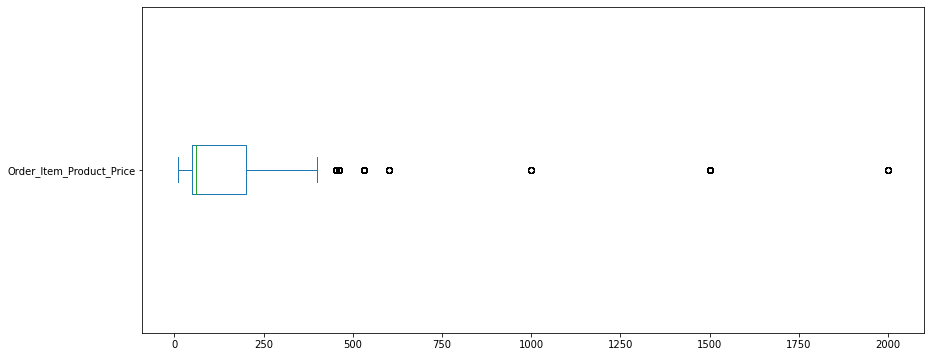

In [58]:
dataco_df['Order_Item_Product_Price'].plot(kind='box', vert=False, figsize=(14,6))

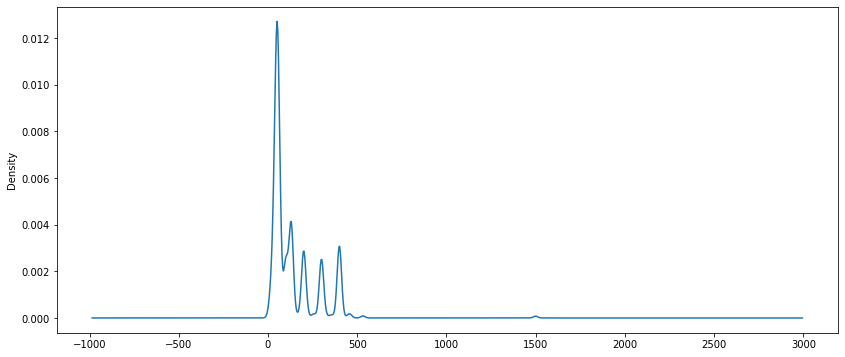

In [59]:
dataco_df['Order_Item_Product_Price'].plot(kind='density', figsize=(14,6))

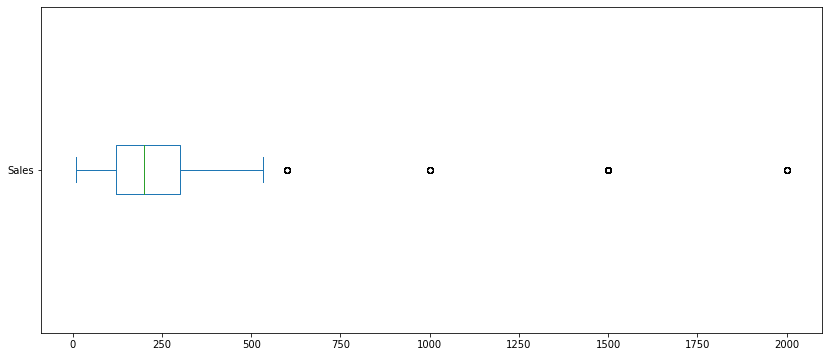

In [60]:
dataco_df['Sales'].plot(kind='box', vert=False, figsize=(14,6))

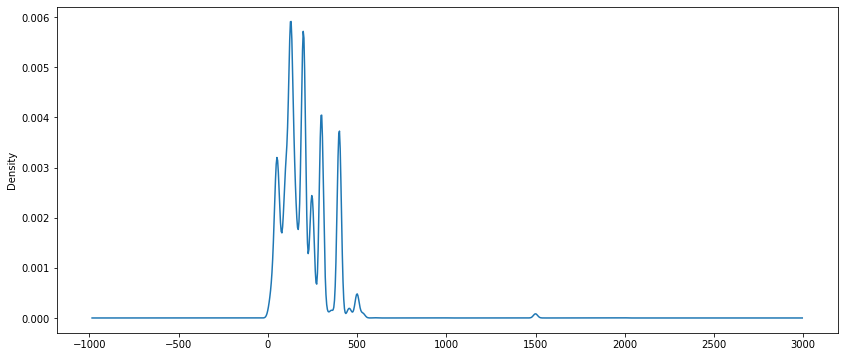

In [61]:
dataco_df['Sales'].plot(kind='density', figsize=(14,6))

In [62]:
datacorr = dataco_df.corr()
datacorr

,Days_for_shipping_(real),Days_for_shipment_(scheduled),Benefit_per_order,Sales_per_customer,Late_delivery_risk,Category_Id,Customer_Id,Customer_Zipcode,Department_Id,Latitude,...,Order_Item_Product_Price,Order_Item_Profit_Ratio,Order_Item_Quantity,Sales,Order_Item_Total,Order_Profit_Per_Order,Product_Card_Id,Product_Category_Id,Product_Price,Product_Status
Days_for_shipping_(real),1.000000,0.515880,-0.005101,0.001757,0.401415,-0.000348,0.003432,0.000112,-0.001631,-0.004073,...,0.002185,-0.004638,-0.000811,0.001962,0.001757,-0.005101,-0.000859,-0.000348,0.002185,NaN
Days_for_shipment_(scheduled),0.515880,1.000000,-0.000185,0.006445,-0.369352,-0.000367,0.000899,-0.003019,-0.000262,-0.005300,...,0.006912,-0.001822,-0.002925,0.006327,0.006445,-0.000185,-0.000431,-0.000367,0.006912,NaN
Benefit_per_order,-0.005101,-0.000185,1.000000,0.133484,-0.003727,0.031889,0.009354,0.002235,0.031442,0.000338,...,0.103459,0.823689,0.015696,0.131816,0.133484,1.000000,0.033161,0.031889,0.103459,NaN
Sales_per_customer,0.001757,0.006445,0.133484,1.000000,-0.003791,0.225201,0.060181,-0.001304,0.232367,-0.000223,...,0.781781,-0.001439,0.105413,0.989744,1.000000,0.133484,0.236367,0.225201,0.781781,NaN
Late_delivery_risk,0.401415,-0.369352,-0.003727,-0.003791,1.000000,0.001752,0.001484,0.003148,0.001077,0.000679,...,-0.002175,-0.002316,-0.000139,-0.003564,-0.003791,-0.003727,0.001490,0.001752,-0.002175,NaN
Category_Id,-0.000348,-0.000367,0.031889,0.225201,0.001752,1.000000,0.274633,0.002898,0.888835,0.002195,...,0.461059,-0.001614,-0.302408,0.227483,0.225201,0.031889,0.991092,1.000000,0.461059,NaN
Customer_Id,0.003432,0.000899,0.009354,0.060181,0.001484,0.274633,1.000000,0.002022,0.136897,0.002335,...,0.111118,-0.000337,-0.091328,0.060961,0.060181,0.009354,0.228039,0.274633,0.111118,NaN
Customer_Zipcode,0.000112,-0.003019,0.002235,-0.001304,0.003148,0.002898,0.002022,1.000000,0.002878,0.584553,...,0.002191,0.003364,-0.006174,-0.001490,-0.001304,0.002235,0.003173,0.002898,0.002191,NaN
Department_Id,-0.001631,-0.000262,0.031442,0.232367,0.001077,0.888835,0.136897,0.002878,1.000000,0.002460,...,0.446743,-0.003044,-0.265437,0.234718,0.232367,0.031442,0.906117,0.888835,0.446743,NaN
Latitude,-0.004073,-0.005300,0.000338,-0.000223,0.000679,0.002195,0.002335,0.584553,0.002460,1.000000,...,0.000471,-0.000081,-0.001853,-0.000696,-0.000223,0.000338,0.002031,0.002195,0.000471,NaN


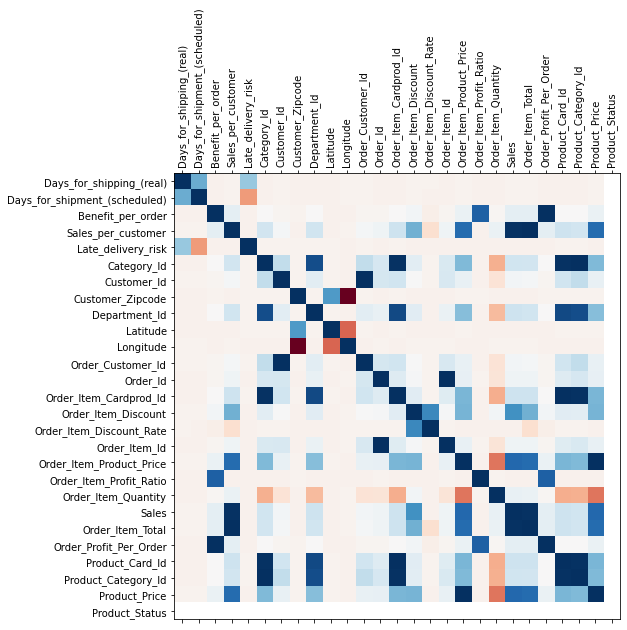

In [63]:
fig = plt.figure(figsize=(8,8))
plt.matshow(datacorr, cmap='RdBu', fignum=fig.number)
plt.xticks(range(len(datacorr.columns)), datacorr.columns, rotation='vertical');
plt.yticks(range(len(datacorr.columns)), datacorr.columns);

Check for variance between every columns in the data and exclude columns that dont have any variance

In [64]:
def check_variance(data, log=False):
    
    no_variance_cols = []
    for i in data.dtypes.index:
        number_unique = len(data[i].value_counts())
        if number_unique == 1:
            print(i, "Unique Value: {}".format(data[i].value_counts().index[0]))
            no_variance_cols.append(i)
        
    if log:
        return no_variance_cols, {"No variability in attribute(s):": no_variance_cols}
    else:            
        return no_variance_cols
no_variance_cols, variance_log = check_variance(dataco_df, log=True)

Product_Status Unique Value: 0


In [65]:
dataco_df.drop([
    'Product_Status'
], axis = True, inplace = True)

Finding similarities between multiple columns

In [66]:
def check_redundancies(data):
    
    redundancy_list = []
    
    for i in list(combinations(data.columns, 2)):
        
        if all(data[i[0]] == data[i[1]]):
            redundancy_list.append(i)
            print("{} and {} are similar".format(*i))
    
    return redundancy_list
                
redundancies = check_redundancies(dataco_df)

Benefit_per_order and Order_Profit_Per_Order are similar
Sales_per_customer and Order_Item_Total are similar
Category_Id and Product_Category_Id are similar
Customer_Id and Order_Customer_Id are similar
Order_Item_Cardprod_Id and Product_Card_Id are similar
Order_Item_Product_Price and Product_Price are similar


Remove columns with redundancies

In [67]:
drop_list =[]
for c in redundancies:
    if len(c[0]) < len(c[1]):
        drop_list.append(c[1])
    else:
        drop_list.append(c[0])

In [68]:
dataco_df = dataco_df.drop(columns=drop_list)

In [72]:
dataco_df.columns

Index(['Type', 'Days_for_shipping_(real)', 'Days_for_shipment_(scheduled)',
       'Benefit_per_order', 'Delivery_Status', 'Late_delivery_risk',
       'Category_Id', 'Category_Name', 'Customer_City', 'Customer_Country',
       'Customer_Fname', 'Customer_Id', 'Customer_Lname', 'Customer_Segment',
       'Customer_State', 'Customer_Street', 'Customer_Zipcode',
       'Department_Id', 'Department_Name', 'Latitude', 'Longitude', 'Market',
       'Order_City', 'Order_Country', 'order_date_(DateOrders)', 'Order_Id',
       'Order_Item_Discount', 'Order_Item_Discount_Rate', 'Order_Item_Id',
       'Order_Item_Profit_Ratio', 'Order_Item_Quantity', 'Sales',
       'Order_Item_Total', 'Order_Region', 'Order_State', 'Order_Status',
       'Product_Card_Id', 'Product_Name', 'Product_Price',
       'shipping_date_(DateOrders)', 'Shipping_Mode'],
      dtype='object')

Analyse columns to find more redundancies or columns that is not required for analysis

In [73]:
dataco_df.drop(columns=["Customer_Lname", 
                       "Customer_Fname", 
                       "Department_Name"], 
              inplace=True)

Comparison and visualization attributes with relevant data for individual analysis of each attributes

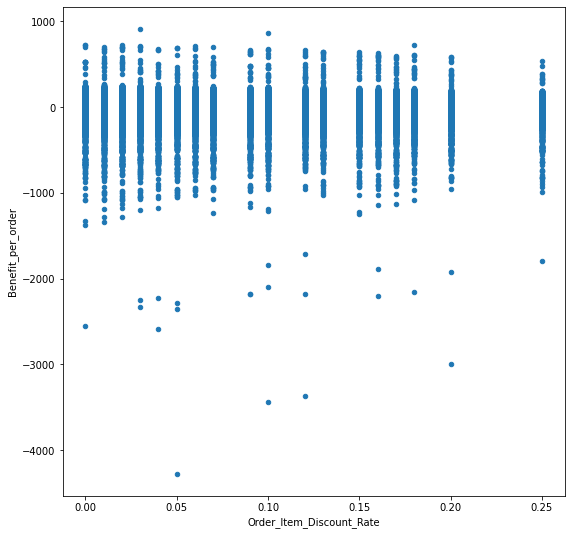

In [75]:
dataco_df.plot(kind='scatter', x='Order_Item_Discount_Rate', y='Benefit_per_order', figsize=(9,9))

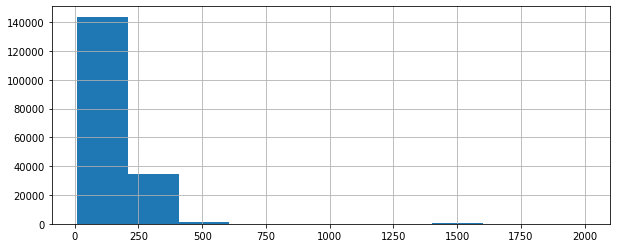

In [77]:
dataco_df['Product_Price'].hist(figsize=(10, 4));

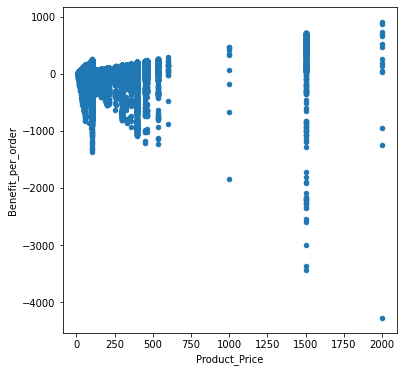

In [79]:
dataco_df.plot(kind='scatter', x='Product_Price', y='Benefit_per_order', figsize=(6,6))

/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.



Text(0, 0.5, 'Order_Item_Quantity')

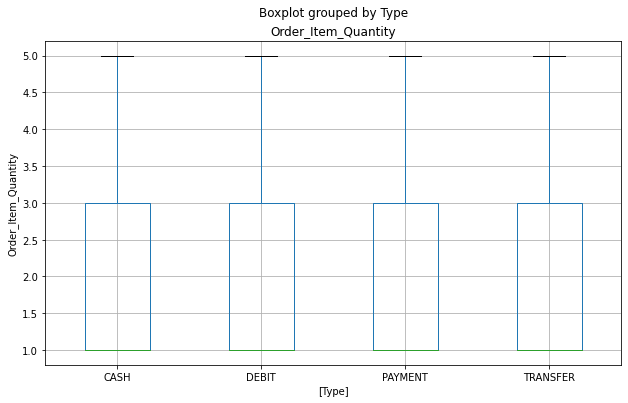

In [80]:
ax = dataco_df[['Order_Item_Quantity', 'Type']].boxplot(by='Type', figsize=(10,6))
ax.set_ylabel('Order_Item_Quantity')

([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22],
 <a list of 23 Text major ticklabel objects>)

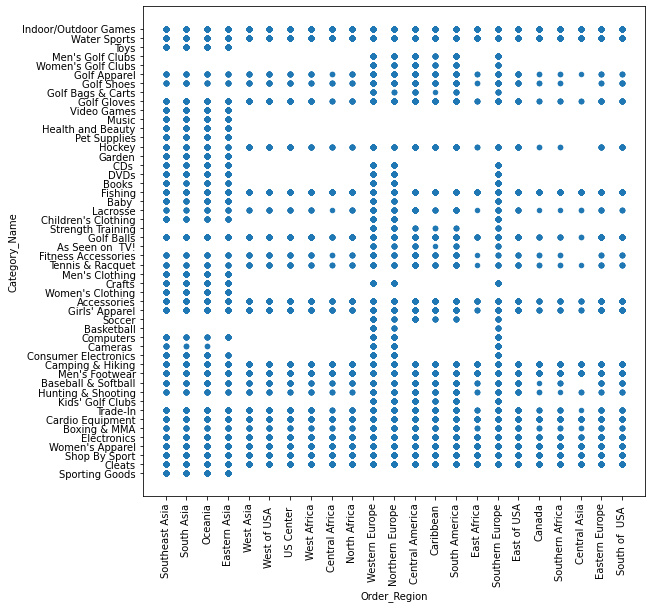

In [120]:
dataco_df.plot(kind='scatter', x='Order_Region', y='Category_Name', figsize=(9,9))
# plt.scatter(dataco_df['Order_Region'], dataco_df['Category_Name'])
plt.xticks(rotation=90)

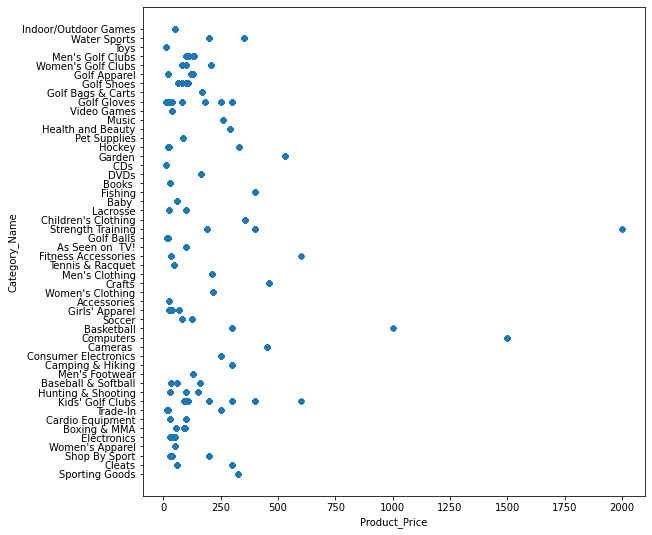

In [82]:
dataco_df.plot(kind='scatter', x='Product_Price', y='Category_Name', figsize=(9,9))

Delivery Status of few countries

In [83]:
dataco_df.Delivery_Status.unique()

array(['Advance shipping', 'Late delivery', 'Shipping on time',
       'Shipping canceled'], dtype=object)

In [84]:
dataco_df.Order_Country.unique()

array(['Indonesia', 'India', 'Australia', 'China', 'Japón',
       'Corea del Sur', 'Singapur', 'Turquía', 'Mongolia',
       'Estados Unidos', 'Nigeria', 'República Democrática del Congo',
       'Senegal', 'Marruecos', 'Alemania', 'Francia', 'Países Bajos',
       'Reino Unido', 'Guatemala', 'El Salvador', 'Panamá',
       'República Dominicana', 'Venezuela', 'Colombia', 'Honduras',
       'Brasil', 'México', 'Uruguay', 'Argentina', 'Cuba', 'Perú',
       'Nicaragua', 'Ecuador', 'Angola', 'Sudán', 'Somalia',
       'Costa de Marfil', 'Egipto', 'Italia', 'España', 'Suecia',
       'Austria', 'Canada', 'Madagascar', 'Argelia', 'Liberia', 'Zambia',
       'Níger', 'SudAfrica', 'Mozambique', 'Tanzania', 'Ruanda', 'Israel',
       'Nueva Zelanda', 'Bangladés', 'Tailandia', 'Irak', 'Arabia Saudí',
       'Filipinas', 'Kazajistán', 'Irán', 'Myanmar (Birmania)',
       'Uzbekistán', 'Benín', 'Camerún', 'Kenia', 'Togo', 'Ucrania',
       'Polonia', 'Portugal', 'Rumania', 'Trinidad y Tobago',


In [88]:
shipping_on_time_df = dataco_df[(dataco_df['Order_Country'] == 'Australia') & (dataco_df['Delivery_Status'] == 'Shipping on time')]
shipping_on_time_df

,Type,Days_for_shipping_(real),Days_for_shipment_(scheduled),Benefit_per_order,Delivery_Status,Late_delivery_risk,Category_Id,Category_Name,Customer_City,Customer_Country,...,Sales,Order_Item_Total,Order_Region,Order_State,Order_Status,Product_Card_Id,Product_Name,Product_Price,shipping_date_(DateOrders),Shipping_Mode
230,DEBIT,4,4,27.360001,Shipping on time,0,17,Cleats,San Diego,EE. UU.,...,59.990002,56.990002,Oceania,Queensland,COMPLETE,365,Perfect Fitness Perfect Rip Deck,59.990002,2/20/2016 4:09,Standard Class
247,DEBIT,4,4,-184.259995,Shipping on time,0,18,Men's Footwear,El Paso,EE. UU.,...,129.990005,122.839996,Oceania,Victoria,COMPLETE,403,Nike Men's CJ Elite 2 TD Football Cleat,129.990005,3/18/2016 20:03,Standard Class
260,DEBIT,4,4,7.620000,Shipping on time,0,18,Men's Footwear,Detroit,EE. UU.,...,129.990005,120.889999,Oceania,Victoria,COMPLETE,403,Nike Men's CJ Elite 2 TD Football Cleat,129.990005,2/10/2016 2:25,Standard Class
389,CASH,0,0,-34.750000,Shipping on time,0,73,Sporting Goods,Holland,EE. UU.,...,327.750000,304.809998,Oceania,Queensland,CLOSED,1360,Smart watch,327.750000,1/12/2018 22:32,Same Day
391,PAYMENT,4,4,22.120001,Shipping on time,0,73,Sporting Goods,Brooklyn,EE. UU.,...,327.750000,294.980011,Oceania,Queensland,PENDING_PAYMENT,1360,Smart watch,327.750000,1/16/2018 9:50,Standard Class
436,TRANSFER,4,4,-251.380005,Shipping on time,0,73,Sporting Goods,Hempstead,EE. UU.,...,327.750000,327.750000,Oceania,Nueva Gales del Sur,PROCESSING,1360,Smart watch,327.750000,1/15/2018 18:04,Standard Class
510,PAYMENT,2,2,51.900002,Shipping on time,0,29,Shop By Sport,Caguas,Puerto Rico,...,159.960007,153.559998,Oceania,Victoria,PENDING_PAYMENT,627,Under Armour Girls' Toddler Spine Surge Runni,39.990002,12/28/2015 23:29,Second Class
711,TRANSFER,4,4,-97.650002,Shipping on time,0,17,Cleats,Caguas,Puerto Rico,...,299.950012,254.960007,Oceania,Nueva Gales del Sur,PENDING,365,Perfect Fitness Perfect Rip Deck,59.990002,1/11/2016 0:42,Standard Class
824,DEBIT,4,4,40.220001,Shipping on time,0,18,Men's Footwear,Atlanta,EE. UU.,...,129.990005,118.290001,Oceania,Nueva Gales del Sur,COMPLETE,403,Nike Men's CJ Elite 2 TD Football Cleat,129.990005,3/7/2016 10:47,Standard Class
854,DEBIT,4,4,-25.740000,Shipping on time,0,18,Men's Footwear,Simi Valley,EE. UU.,...,129.990005,114.389999,Oceania,Australia Occidental,COMPLETE,403,Nike Men's CJ Elite 2 TD Football Cleat,129.990005,1/22/2016 4:43,Standard Class


In [89]:
shipping_on_time_df = dataco_df[(dataco_df['Order_Country'] == 'Francia') & (dataco_df['Delivery_Status'] == 'Shipping on time')]
shipping_on_time_df

,Type,Days_for_shipping_(real),Days_for_shipment_(scheduled),Benefit_per_order,Delivery_Status,Late_delivery_risk,Category_Id,Category_Name,Customer_City,Customer_Country,...,Sales,Order_Item_Total,Order_Region,Order_State,Order_Status,Product_Card_Id,Product_Name,Product_Price,shipping_date_(DateOrders),Shipping_Mode
64,PAYMENT,2,2,132.289993,Shipping on time,0,9,Cardio Equipment,Caguas,Puerto Rico,...,299.970001,269.970001,Western Europe,Isla de Francia,PENDING_PAYMENT,191,Nike Men's Free 5.0+ Running Shoe,99.989998,7/24/2017 7:16,Second Class
70,PAYMENT,2,2,20.930000,Shipping on time,0,24,Women's Apparel,Caguas,Puerto Rico,...,150.000000,139.500000,Western Europe,Isla de Francia,PENDING_PAYMENT,502,Nike Men's Dri-FIT Victory Golf Polo,50.000000,7/24/2017 7:16,Second Class
153,DEBIT,2,2,21.360001,Shipping on time,0,62,Cameras,Caguas,Puerto Rico,...,452.040008,427.179993,Western Europe,Isla de Francia,COMPLETE,1349,Web Camera,452.040008,10/15/2017 8:44,Second Class
306,DEBIT,4,4,-115.419998,Shipping on time,0,9,Cardio Equipment,Kenner,EE. UU.,...,499.950012,484.950012,Western Europe,Centro-Valle de Loira,COMPLETE,191,Nike Men's Free 5.0+ Running Shoe,99.989998,9/9/2017 10:32,Standard Class
482,PAYMENT,2,2,0.000000,Shipping on time,0,13,Electronics,Caguas,Puerto Rico,...,127.959999,126.680000,Western Europe,Languedoc-Rosellón-Mediodía-Pirineos,PENDING_PAYMENT,276,Under Armour Women's Ignite Slide,31.990000,9/9/2015 4:22,Second Class
487,PAYMENT,2,2,-146.600006,Shipping on time,0,24,Women's Apparel,Caguas,Puerto Rico,...,200.000000,200.000000,Western Europe,Isla de Francia,PENDING_PAYMENT,502,Nike Men's Dri-FIT Victory Golf Polo,50.000000,6/26/2015 5:21,Second Class
494,PAYMENT,2,2,37.110001,Shipping on time,0,29,Shop By Sport,Caguas,Puerto Rico,...,159.960007,127.970001,Western Europe,Isla de Francia,PENDING_PAYMENT,627,Under Armour Girls' Toddler Spine Surge Runni,39.990002,7/24/2017 7:16,Second Class
542,PAYMENT,2,2,-72.629997,Shipping on time,0,26,Girls' Apparel,Caguas,Puerto Rico,...,350.000000,290.500000,Western Europe,Isla de Francia,PENDING_PAYMENT,565,adidas Youth Germany Black/Red Away Match Soc,70.000000,6/26/2015 5:21,Second Class
565,DEBIT,2,2,22.840000,Shipping on time,0,66,Crafts,Caguas,Puerto Rico,...,461.480011,456.869995,Western Europe,Isla de Francia,COMPLETE,1353,Porcelain crafts,461.480011,11/8/2017 9:03,Second Class
576,DEBIT,2,2,32.779999,Shipping on time,0,18,Men's Footwear,Caguas,Puerto Rico,...,129.990005,126.089996,Western Europe,Languedoc-Rosellón-Mediodía-Pirineos,COMPLETE,403,Nike Men's CJ Elite 2 TD Football Cleat,129.990005,8/4/2015 20:32,Second Class


In [90]:
shipping_cancelled_df = dataco_df[(dataco_df['Order_Country'] == 'Austria') & (dataco_df['Delivery_Status'] == 'Shipping canceled')]
shipping_cancelled_df

,Type,Days_for_shipping_(real),Days_for_shipment_(scheduled),Benefit_per_order,Delivery_Status,Late_delivery_risk,Category_Id,Category_Name,Customer_City,Customer_Country,...,Sales,Order_Item_Total,Order_Region,Order_State,Order_Status,Product_Card_Id,Product_Name,Product_Price,shipping_date_(DateOrders),Shipping_Mode
1799,TRANSFER,2,4,-130.679993,Shipping canceled,0,24,Women's Apparel,Chesapeake,EE. UU.,...,200.000000,198.000000,Western Europe,Viena,SUSPECTED_FRAUD,502,Nike Men's Dri-FIT Victory Golf Polo,50.000000,7/19/2015 8:39,Standard Class
9895,TRANSFER,3,4,131.130005,Shipping canceled,0,9,Cardio Equipment,Corona,EE. UU.,...,399.959992,387.959992,Western Europe,Viena,CANCELED,191,Nike Men's Free 5.0+ Running Shoe,99.989998,6/25/2017 4:10,Standard Class
9903,TRANSFER,3,4,39.150002,Shipping canceled,0,24,Women's Apparel,Brighton,EE. UU.,...,200.000000,174.000000,Western Europe,Alta Austria,CANCELED,502,Nike Men's Dri-FIT Victory Golf Polo,50.000000,8/12/2015 5:17,Standard Class
10439,TRANSFER,5,4,87.139999,Shipping canceled,0,17,Cleats,Baltimore,EE. UU.,...,299.950012,248.960007,Western Europe,Viena,SUSPECTED_FRAUD,365,Perfect Fitness Perfect Rip Deck,59.990002,12/19/2016 20:53,Standard Class
11358,TRANSFER,6,2,-60.750000,Shipping canceled,0,43,Camping & Hiking,Caguas,Puerto Rico,...,299.980011,269.980011,Western Europe,Viena,SUSPECTED_FRAUD,957,Diamondback Women's Serene Classic Comfort Bi,299.980011,9/15/2015 12:05,Second Class
11591,TRANSFER,6,2,-58.889999,Shipping canceled,0,37,Electronics,Caguas,Puerto Rico,...,95.970001,76.779999,Western Europe,Viena,SUSPECTED_FRAUD,835,Bridgestone e6 Straight Distance NFL Carolina,31.990000,9/15/2015 12:05,Second Class
11705,TRANSFER,6,2,31.940001,Shipping canceled,0,29,Shop By Sport,Caguas,Puerto Rico,...,199.949997,195.949997,Western Europe,Viena,SUSPECTED_FRAUD,627,Under Armour Girls' Toddler Spine Surge Runni,39.990002,9/15/2015 12:05,Second Class
11800,TRANSFER,4,4,39.580002,Shipping canceled,0,18,Men's Footwear,Caguas,Puerto Rico,...,129.990005,113.089996,Western Europe,Viena,CANCELED,403,Nike Men's CJ Elite 2 TD Football Cleat,129.990005,8/14/2015 2:40,Standard Class
15357,TRANSFER,2,4,-32.799999,Shipping canceled,0,9,Cardio Equipment,Dallas,EE. UU.,...,499.950012,399.959992,Western Europe,Stiria,SUSPECTED_FRAUD,191,Nike Men's Free 5.0+ Running Shoe,99.989998,10/1/2017 15:24,Standard Class
15376,TRANSFER,2,4,45.910000,Shipping canceled,0,37,Electronics,Greeley,EE. UU.,...,159.949997,131.160004,Western Europe,Tirol,SUSPECTED_FRAUD,828,Bridgestone e6 Straight Distance NFL San Dieg,31.990000,10/23/2015 9:55,Standard Class


In [91]:
shipping_cancelled_df = dataco_df[(dataco_df['Order_Country'] == 'Italia') & (dataco_df['Delivery_Status'] == 'Shipping canceled')]
shipping_cancelled_df

,Type,Days_for_shipping_(real),Days_for_shipment_(scheduled),Benefit_per_order,Delivery_Status,Late_delivery_risk,Category_Id,Category_Name,Customer_City,Customer_Country,...,Sales,Order_Item_Total,Order_Region,Order_State,Order_Status,Product_Card_Id,Product_Name,Product_Price,shipping_date_(DateOrders),Shipping_Mode
757,TRANSFER,4,4,115.230003,Shipping canceled,0,17,Cleats,Baltimore,EE. UU.,...,239.960007,235.160004,Southern Europe,Piamonte,CANCELED,365,Perfect Fitness Perfect Rip Deck,59.990002,7/18/2015 2:31,Standard Class
759,TRANSFER,5,4,23.860001,Shipping canceled,0,17,Cleats,Fullerton,EE. UU.,...,239.960007,211.160004,Southern Europe,Lombardía,CANCELED,365,Perfect Fitness Perfect Rip Deck,59.990002,7/28/2015 11:06,Standard Class
769,TRANSFER,4,4,38.869999,Shipping canceled,0,29,Shop By Sport,Baltimore,EE. UU.,...,159.960007,143.960007,Southern Europe,Piamonte,CANCELED,627,Under Armour Girls' Toddler Spine Surge Runni,39.990002,7/18/2015 2:31,Standard Class
770,TRANSFER,3,4,43.160000,Shipping canceled,0,24,Women's Apparel,Roseburg,EE. UU.,...,200.000000,166.000000,Southern Europe,Sicilia,CANCELED,502,Nike Men's Dri-FIT Victory Golf Polo,50.000000,9/27/2015 4:52,Standard Class
1796,TRANSFER,2,4,-322.510010,Shipping canceled,0,17,Cleats,Piscataway,EE. UU.,...,239.960007,201.570007,Southern Europe,Apulia,SUSPECTED_FRAUD,365,Perfect Fitness Perfect Rip Deck,59.990002,9/14/2015 12:15,Standard Class
1797,TRANSFER,6,4,-305.950012,Shipping canceled,0,17,Cleats,Miami,EE. UU.,...,239.960007,179.970001,Southern Europe,Lacio,SUSPECTED_FRAUD,365,Perfect Fitness Perfect Rip Deck,59.990002,10/19/2015 5:22,Standard Class
1800,TRANSFER,2,4,47.560001,Shipping canceled,0,29,Shop By Sport,Piscataway,EE. UU.,...,159.960007,151.960007,Southern Europe,Apulia,SUSPECTED_FRAUD,627,Under Armour Girls' Toddler Spine Surge Runni,39.990002,9/14/2015 12:15,Standard Class
1809,TRANSFER,2,4,44.150002,Shipping canceled,0,37,Electronics,Piscataway,EE. UU.,...,127.959999,95.970001,Southern Europe,Apulia,SUSPECTED_FRAUD,825,Bridgestone e6 Straight Distance NFL Tennesse,31.990000,9/14/2015 12:15,Standard Class
2503,TRANSFER,3,4,-104.699997,Shipping canceled,0,24,Women's Apparel,New York,EE. UU.,...,150.000000,136.500000,Southern Europe,Campania,CANCELED,502,Nike Men's Dri-FIT Victory Golf Polo,50.000000,9/29/2017 10:41,Standard Class
5149,TRANSFER,4,4,73.470001,Shipping canceled,0,12,Boxing & MMA,Hollywood,EE. UU.,...,164.910004,163.259995,Southern Europe,Toscana,SUSPECTED_FRAUD,249,Under Armour Women's Micro G Skulpt Running S,54.970001,8/14/2015 4:25,Standard Class


In [123]:
late_delivery = dataco_df[(dataco_df['Delivery_Status'] == 'Late delivery')]
fig = px.bar(late_delivery['Category_Name'].value_counts().nlargest(10), 
             title="Top 10 products with most late deliveries",
            labels={'value':'Number of late deliveries','index':'Category'})
fig.show()

Order Status of Different countries and analysis of countries with suspected fraud

In [93]:
dataco_df['Order_Status'].value_counts()

COMPLETE           59491
PENDING_PAYMENT    39832
PROCESSING         21902
PENDING            20227
CLOSED             19616
ON_HOLD             9804
SUSPECTED_FRAUD     4062
CANCELED            3692
PAYMENT_REVIEW      1893
Name: Order_Status, dtype: int64

In [97]:
pending_payment_df = dataco_df[dataco_df['Order_Status'] == 'PENDING_PAYMENT']
pending_payment_df

In [99]:
pending_payment_df['Order_Country'].value_counts()

Estados Unidos                     5238
Francia                            3093
México                             2863
Alemania                           2072
Australia                          1919
Brasil                             1846
Reino Unido                        1707
China                              1347
India                              1068
Italia                             1063
Indonesia                           963
España                              879
Turquía                             830
El Salvador                         827
República Dominicana                811
Cuba                                804
Honduras                            783
Nicaragua                           668
Guatemala                           538
Filipinas                           507
Países Bajos                        486
Nigeria                             471
Argentina                           409
Panamá                              358
Nueva Zelanda                       347


In [101]:
complete_payment_df = dataco_df[dataco_df['Order_Status'] == 'COMPLETE']
complete_payment_df

In [102]:
complete_payment_df['Order_Country'].value_counts()

Estados Unidos                     8437
Francia                            4386
México                             4373
Alemania                           3143
Australia                          2849
Brasil                             2577
Reino Unido                        2350
China                              1776
Italia                             1630
India                              1568
Indonesia                          1364
El Salvador                        1255
España                             1246
Honduras                           1173
República Dominicana               1148
Cuba                               1117
Turquía                            1083
Nicaragua                           953
Guatemala                           858
Nigeria                             841
Filipinas                           659
Panamá                              645
Países Bajos                        597
Colombia                            587
Argentina                           571


In [103]:
suspected_fraud_df = dataco_df[dataco_df['Order_Status'] == 'SUSPECTED_FRAUD']
suspected_fraud_df

,Type,Days_for_shipping_(real),Days_for_shipment_(scheduled),Benefit_per_order,Delivery_Status,Late_delivery_risk,Category_Id,Category_Name,Customer_City,Customer_Country,...,Sales,Order_Item_Total,Order_Region,Order_State,Order_Status,Product_Card_Id,Product_Name,Product_Price,shipping_date_(DateOrders),Shipping_Mode
10,TRANSFER,6,2,130.580002,Shipping canceled,0,73,Sporting Goods,Caguas,Puerto Rico,...,327.750000,272.029999,Eastern Asia,Tokio,SUSPECTED_FRAUD,1360,Smart watch,327.750000,1/19/2018 9:18,Second Class
24,TRANSFER,2,2,90.279999,Shipping canceled,0,73,Sporting Goods,Billings,EE. UU.,...,327.750000,288.420013,Oceania,Queensland,SUSPECTED_FRAUD,1360,Smart watch,327.750000,1/15/2018 4:24,Second Class
183,TRANSFER,5,4,28.850000,Shipping canceled,0,13,Electronics,Freeport,EE. UU.,...,134.970001,128.220001,US Center,Texas,SUSPECTED_FRAUD,278,Under Armour Men's Compression EV SL Slide,44.990002,5/13/2016 17:42,Standard Class
184,TRANSFER,5,4,133.910004,Shipping canceled,0,9,Cardio Equipment,Fort Washington,EE. UU.,...,299.970001,278.970001,West of USA,Arizona,SUSPECTED_FRAUD,191,Nike Men's Free 5.0+ Running Shoe,99.989998,4/7/2016 19:51,Standard Class
185,TRANSFER,6,4,79.160004,Shipping canceled,0,9,Cardio Equipment,Bakersfield,EE. UU.,...,299.970001,272.970001,West of USA,California,SUSPECTED_FRAUD,191,Nike Men's Free 5.0+ Running Shoe,99.989998,8/20/2016 2:51,Standard Class
186,TRANSFER,5,4,19.110001,Shipping canceled,0,9,Cardio Equipment,Fort Washington,EE. UU.,...,299.970001,272.970001,West of USA,Arizona,SUSPECTED_FRAUD,191,Nike Men's Free 5.0+ Running Shoe,99.989998,4/7/2016 19:51,Standard Class
187,TRANSFER,2,4,10.770000,Shipping canceled,0,17,Cleats,Corona,EE. UU.,...,179.970001,170.970001,West of USA,California,SUSPECTED_FRAUD,365,Perfect Fitness Perfect Rip Deck,59.990002,5/20/2016 16:38,Standard Class
188,TRANSFER,3,4,-284.529999,Shipping canceled,0,17,Cleats,Cincinnati,EE. UU.,...,179.970001,167.369995,West of USA,Arizona,SUSPECTED_FRAUD,365,Perfect Fitness Perfect Rip Deck,59.990002,5/8/2016 13:40,Standard Class
189,TRANSFER,3,4,69.680000,Shipping canceled,0,17,Cleats,Germantown,EE. UU.,...,179.970001,158.369995,East of USA,Ohio,SUSPECTED_FRAUD,365,Perfect Fitness Perfect Rip Deck,59.990002,4/24/2016 2:50,Standard Class
190,TRANSFER,2,4,7.480000,Shipping canceled,0,29,Shop By Sport,Carrollton,EE. UU.,...,119.970001,118.769997,US Center,Indiana,SUSPECTED_FRAUD,627,Under Armour Girls' Toddler Spine Surge Runni,39.990002,7/3/2016 8:10,Standard Class


In [104]:
suspected_fraud_df['Order_Country'].value_counts()

Estados Unidos                     573
Francia                            362
México                             317
Alemania                           227
Australia                          197
Brasil                             196
Reino Unido                        140
China                              124
India                              116
Italia                             107
España                              90
Nicaragua                           90
Indonesia                           84
Cuba                                81
República Dominicana                76
Guatemala                           75
Turquía                             67
Honduras                            62
El Salvador                         62
Colombia                            49
Países Bajos                        46
Nigeria                             40
Filipinas                           40
Argentina                           39
Venezuela                           38
Austria                  

Products with maximum, minimum price and discounts

In [106]:
dataco_df.groupby('Product_Name')['Product_Price'].sum().sort_values(ascending = False)

Product_Name
Field & Stream Sportsman 16 Gun Fire Safe        6.929654e+06
Diamondback Women's Serene Classic Comfort Bi    4.118426e+06
Pelican Sunstream 100 Kayak                      3.099845e+06
Nike Men's CJ Elite 2 TD Football Cleat          2.891758e+06
Perfect Fitness Perfect Rip Deck                 1.470655e+06
Nike Men's Free 5.0+ Running Shoe                1.216778e+06
Nike Men's Dri-FIT Victory Golf Polo             1.051750e+06
O'Brien Men's Neoprene Life Vest                 9.645140e+05
Dell Laptop                                      6.630000e+05
Under Armour Girls' Toddler Spine Surge Runni    4.245738e+05
Web Camera                                       2.676077e+05
Lawn mower                                       2.577687e+05
Children's heaters                               2.328292e+05
Porcelain crafts                                 2.233563e+05
Summer dresses                                   1.402830e+05
Smart watch                                      1.170068

In [110]:
dataco_df.groupby('Product_Name')['Product_Price'].sum().sort_values(ascending = True)

Product_Name
Clicgear 8.0 Shoe Brush                          2.847150e+03
CDs of rock                                      3.059590e+03
Hirzl Men's Hybrid Golf Glove                    4.227180e+03
MDGolf Pittsburgh Penguins Putter                4.239470e+03
Hirzl Women's Hybrid Golf Glove                  4.661890e+03
Glove It Urban Brick Golf Towel                  4.797000e+03
Glove It Imperial Golf Towel                     4.828980e+03
LIJA Women's Argyle Golf Polo                    5.280000e+03
Hirzl Women's Soffft Flex Golf Glove             5.361020e+03
Polar FT4 Heart Rate Monitor                     5.399400e+03
Bag Boy M330 Push Cart                           5.519310e+03
Glove It Women's Mod Oval Golf Glove             5.537230e+03
The North Face Women's Recon Backpack            5.643000e+03
Elevation Training Mask 2.0                      5.919260e+03
Polar Loop Activity Tracker                      5.937300e+03
Brooks Women's Ghost 6 Running Shoe              5.939340

In [105]:
dataco_df.groupby('Product_Name')['Order_Item_Discount'].sum().sort_values(ascending = False)

Product_Name
Field & Stream Sportsman 16 Gun Fire Safe        702728.000000
Perfect Fitness Perfect Rip Deck                 447968.174641
Diamondback Women's Serene Classic Comfort Bi    417649.500000
Nike Men's Free 5.0+ Running Shoe                371942.588082
Nike Men's Dri-FIT Victory Golf Polo             319091.500000
Pelican Sunstream 100 Kayak                      314327.000000
Nike Men's CJ Elite 2 TD Football Cleat          293263.099117
O'Brien Men's Neoprene Life Vest                 292550.629731
Under Armour Girls' Toddler Spine Surge Runni    128314.031208
Dell Laptop                                       67605.000000
Web Camera                                        27111.000336
Lawn mower                                        26003.519578
Children's heaters                                23561.909587
Porcelain crafts                                  22651.450000
Summer dresses                                    14276.439729
Smart watch                               

In [111]:
dataco_df.groupby('Product_Name')['Order_Item_Discount'].sum().sort_values(ascending = True)

Product_Name
CDs of rock                                         309.559999
Bushnell Pro X7 Jolt Slope Rangefinder              537.000000
SOLE E25 Elliptical                                 585.000000
Polar Loop Activity Tracker                         602.010001
Toys                                                619.269999
Merrell Women's Grassbow Sport Waterproof Hik       679.250000
Nike Men's Fingertrap Max Training Shoe             742.480000
Stiga Master Series ST3100 Competition Indoor       755.699999
Diamondback Girls' Clarity 24 Hybrid Bike 201       775.500000
Bowflex SelectTech 1090 Dumbbells                   828.000000
LIJA Women's Button Golf Dress                      842.400016
Cleveland Golf Women's 588 RTX CB Satin Chrom       861.000003
Clicgear 8.0 Shoe Brush                             909.689990
TaylorMade Women's RBZ SL Rescue                    909.999998
Merrell Women's Siren Mid Waterproof Hiking B       947.680002
Ogio Race Golf Shoes                      

In [115]:
dataco_df.groupby('Product_Name')['Order_Item_Discount_Rate'].sum().sort_values(ascending = False)

Product_Name
Perfect Fitness Perfect Rip Deck                 2490.480012
Nike Men's CJ Elite 2 TD Football Cleat          2262.050011
Nike Men's Dri-FIT Victory Golf Polo             2138.610010
O'Brien Men's Neoprene Life Vest                 1958.610010
Field & Stream Sportsman 16 Gun Fire Safe        1761.630009
Pelican Sunstream 100 Kayak                      1575.940008
Diamondback Women's Serene Classic Comfort Bi    1395.980007
Nike Men's Free 5.0+ Running Shoe                1237.530006
Under Armour Girls' Toddler Spine Surge Runni    1076.680005
Fighting video games                               85.550000
Summer dresses                                     66.330000
Children's heaters                                 66.160000
Web Camera                                         60.140000
Toys                                               53.790000
Adult dog supplies                                 49.980000
DVDs                                               49.260000
Porcelain c

In [116]:
dataco_df.head(20)

,Type,Days_for_shipping_(real),Days_for_shipment_(scheduled),Benefit_per_order,Delivery_Status,Late_delivery_risk,Category_Id,Category_Name,Customer_City,Customer_Country,...,Sales,Order_Item_Total,Order_Region,Order_State,Order_Status,Product_Card_Id,Product_Name,Product_Price,shipping_date_(DateOrders),Shipping_Mode
0,DEBIT,3,4,91.250000,Advance shipping,0,73,Sporting Goods,Caguas,Puerto Rico,...,327.75,314.640015,Southeast Asia,Java Occidental,COMPLETE,1360,Smart watch,327.75,2/3/2018 22:56,Standard Class
1,TRANSFER,5,4,-249.089996,Late delivery,1,73,Sporting Goods,Caguas,Puerto Rico,...,327.75,311.359985,South Asia,Rajastán,PENDING,1360,Smart watch,327.75,1/18/2018 12:27,Standard Class
2,CASH,4,4,-247.779999,Shipping on time,0,73,Sporting Goods,San Jose,EE. UU.,...,327.75,309.720001,South Asia,Rajastán,CLOSED,1360,Smart watch,327.75,1/17/2018 12:06,Standard Class
3,DEBIT,3,4,22.860001,Advance shipping,0,73,Sporting Goods,Los Angeles,EE. UU.,...,327.75,304.809998,Oceania,Queensland,COMPLETE,1360,Smart watch,327.75,1/16/2018 11:45,Standard Class
4,PAYMENT,2,4,134.210007,Advance shipping,0,73,Sporting Goods,Caguas,Puerto Rico,...,327.75,298.250000,Oceania,Queensland,PENDING_PAYMENT,1360,Smart watch,327.75,1/15/2018 11:24,Standard Class
5,TRANSFER,6,4,18.580000,Shipping canceled,0,73,Sporting Goods,Tonawanda,EE. UU.,...,327.75,294.980011,Oceania,Queensland,CANCELED,1360,Smart watch,327.75,1/19/2018 11:03,Standard Class
6,DEBIT,2,1,95.180000,Late delivery,1,73,Sporting Goods,Caguas,Puerto Rico,...,327.75,288.420013,Eastern Asia,Guangdong,COMPLETE,1360,Smart watch,327.75,1/15/2018 10:42,First Class
7,TRANSFER,2,1,68.430000,Late delivery,1,73,Sporting Goods,Miami,EE. UU.,...,327.75,285.140015,Eastern Asia,Guangdong,PROCESSING,1360,Smart watch,327.75,1/15/2018 10:21,First Class
8,CASH,3,2,133.720001,Late delivery,1,73,Sporting Goods,Caguas,Puerto Rico,...,327.75,278.589996,Eastern Asia,Guangdong,CLOSED,1360,Smart watch,327.75,1/16/2018 10:00,Second Class
9,CASH,2,1,132.149994,Late delivery,1,73,Sporting Goods,San Ramon,EE. UU.,...,327.75,275.309998,Eastern Asia,Guangdong,CLOSED,1360,Smart watch,327.75,1/15/2018 9:39,First Class


In [150]:
dataco_df.Product_Name.value_counts()

Perfect Fitness Perfect Rip Deck                 24515
Nike Men's CJ Elite 2 TD Football Cleat          22246
Nike Men's Dri-FIT Victory Golf Polo             21035
O'Brien Men's Neoprene Life Vest                 19298
Field & Stream Sportsman 16 Gun Fire Safe        17325
Pelican Sunstream 100 Kayak                      15500
Diamondback Women's Serene Classic Comfort Bi    13729
Nike Men's Free 5.0+ Running Shoe                12169
Under Armour Girls' Toddler Spine Surge Runni    10617
Fighting video games                               838
Children's heaters                                 652
Summer dresses                                     650
Web Camera                                         592
Toys                                               529
Adult dog supplies                                 492
Lawn mower                                         484
Porcelain crafts                                   484
DVDs                                               483
Dell Lapto

Sales analysis on "Nike" Products

In [152]:
dataco_df['nike'] = dataco_df['Product_Name'].apply(lambda x: x.split(' ')[0] if 'Nike' in x else 0 )

In [154]:
nike_products = dataco_df[dataco_df['nike'] == 'Nike']
nike_products

In [157]:
nike_products['year'] = nike_products['order_date_(DateOrders)'].apply(lambda x: x.split('/')[-1].split(' ')[0])

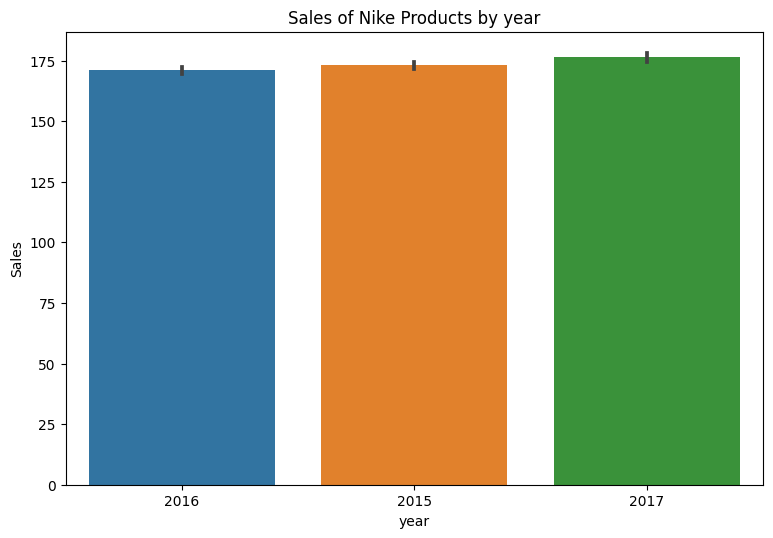

In [158]:
plt.figure(figsize = (9,6), dpi = 100)
plt.title('Sales of Nike Products by year')
sns.barplot(x = 'year', 
            y = 'Sales', 
            data = nike_products);